In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pandas as pd
import activity_image_dataset as aids
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import dcnn

In [2]:
train_signals_dir = []
label_names = {
  0: 'WALKING',
  1: 'WALKING_UPSTAIRS',
  2: 'WALKING_DOWNSTAIRS',
  3: 'SITTING',
  4: 'STANDING',
  5: 'LAYING'
}
signal_names = ['body_gyro_x', 'body_gyro_y', 'body_gyro_z', 'total_acc_x', 'total_acc_y', 'total_acc_z', 'body_acc_x', 'body_acc_y', 'body_acc_z']
for name in signal_names:
  path = 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/Inertial Signals/{}_train.txt'.format(name)
  train_signals_dir.append(path)
  
train_label_dir = 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/y_train.txt'

print(train_signals_dir)
print(train_label_dir)

['C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/Inertial Signals/body_gyro_x_train.txt', 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/Inertial Signals/body_gyro_y_train.txt', 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/Inertial Signals/body_gyro_z_train.txt', 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/Inertial Signals/total_acc_x_train.txt', 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/Inertial Signals/total_acc_y_train.txt', 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/Inertial Signals/total_acc_z_train.txt', 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/Inertial Signals/body_acc_x_train.txt', 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/Inertial Signals/body_acc_y_train.txt', 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/train/Inertial Signals/body_acc_z_train.txt']
C:/

In [3]:
uci_dataset = aids.ActivityImageDataset(train_signals_dir, train_label_dir)
train_dataloader = DataLoader(uci_dataset, batch_size=32, shuffle=True)
print(len(train_dataloader.dataset))

c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  signal_data = pd.read_csv(signal_dir, delim_whitespace=True, header=None).values


(7352, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  signal_data = pd.read_csv(signal_dir, delim_whitespace=True, header=None).values


(7352, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  signal_data = pd.read_csv(signal_dir, delim_whitespace=True, header=None).values


(7352, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  signal_data = pd.read_csv(signal_dir, delim_whitespace=True, header=None).values


(7352, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  signal_data = pd.read_csv(signal_dir, delim_whitespace=True, header=None).values


(7352, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  signal_data = pd.read_csv(signal_dir, delim_whitespace=True, header=None).values


(7352, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  signal_data = pd.read_csv(signal_dir, delim_whitespace=True, header=None).values


(7352, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  signal_data = pd.read_csv(signal_dir, delim_whitespace=True, header=None).values


(7352, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  signal_data = pd.read_csv(signal_dir, delim_whitespace=True, header=None).values


(7352, 128)
7352


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  self.labels = pd.read_csv(label_dir, delim_whitespace=True, header=None).values


In [4]:
images, labels = next(iter(train_dataloader))
labels = labels.flatten()

fig = make_subplots(rows=8, cols=4)
for i, img in enumerate(images): 
  row = i // 4
  col = i % 4
  img = img[0]
  fig.add_trace(px.imshow(np.log(img + 1), color_continuous_scale='gray').data[0], row=row+1, col=col+1)
  fig.update_xaxes(title_text=f'Label: {label_names[int(labels[i])]}', row=row+1, col=col+1)
  fig.update_yaxes(title_text=f'Image {i+1}', row=row+1, col=col+1)

fig.update_layout(
  {
    "autosize": True,
    "margin": dict(l=10, r=10, t=10, b=10),
    "template": "plotly_white",
    "height": 1200  
  }
)
fig.show()

c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:26: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:277.)
  activity_image = torch.tensor([activity_image[:36]], dtype=torch.float32)


In [5]:
import torch.nn.functional as F
from sklearn.manifold import TSNE

def visualize_features(features, labels, epoch):
  tsne = TSNE(n_components=2, random_state=42, perplexity=30)
  features_2d = tsne.fit_transform(features)
  
  plt.figure(figsize=(8, 6))
  plt.scatter(features_2d[:, 0], features_2d[:, 1], c=labels, cmap='viridis', s=5)
  plt.colorbar()
  plt.title(f'Clusters de los features en la época {epoch+1}')
  plt.show()

def train(train_loader, model, criterion, optimizer, num_epochs):
  for epoch in range(num_epochs):
    print('Epoch {}/{}'.format(epoch, num_epochs - 1))
    print('-' * 10)
    model.train()
    running_loss = 0.0
    running_corrects = 0
    all_features = []
    all_labels = []
        
    for inputs, labels in train_loader:
      optimizer.zero_grad()
      outputs, features = model(inputs)
      _,preds = torch.max(outputs,1)
      #labels_one_hot = F.one_hot(labels, 6).float()
      loss = criterion(outputs, labels)      
      loss.backward()
      optimizer.step()
      #statistics
      running_loss += loss.item() * inputs.size(0)
      running_corrects += torch.sum(preds == labels.data)
      
      all_features.append(features.detach().cpu().numpy())
      all_labels.append(labels.detach().cpu().numpy()) 
      
    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = running_corrects.double() / len(train_loader.dataset)
    print('Loss: {:.4f} Acc: {:.4f}'.format(epoch_loss, epoch_acc))
    
    all_features = np.concatenate(all_features, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    visualize_features(all_features, all_labels, epoch)
  print('Finished training')
  

In [6]:
from torchsummary import summary
num_classes = 6
model = dcnn.DCNN(num_classes)
summary(model,(1, 36,68))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 5, 32, 64]             130
         AvgPool2d-2             [-1, 5, 8, 16]               0
            Conv2d-3            [-1, 10, 4, 12]           1,260
         AvgPool2d-4             [-1, 10, 2, 6]               0
            Linear-5                  [-1, 120]          14,520
            Linear-6                    [-1, 6]             726
Total params: 16,636
Trainable params: 16,636
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.01
Forward/backward pass size (MB): 0.09
Params size (MB): 0.06
Estimated Total Size (MB): 0.16
----------------------------------------------------------------


Epoch 0/49
----------
Loss: 1.4271 Acc: 0.6300


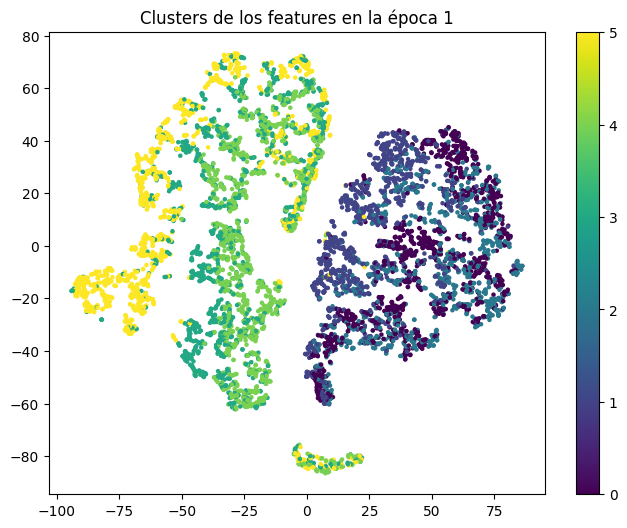

Epoch 1/49
----------
Loss: 1.2862 Acc: 0.7635


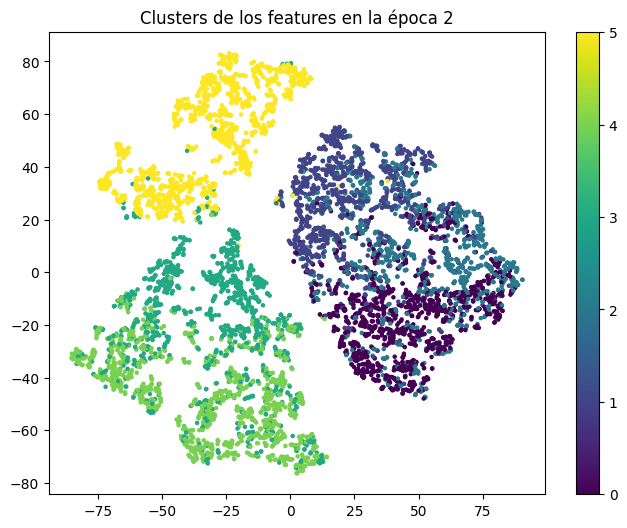

Epoch 2/49
----------
Loss: 1.2000 Acc: 0.8489


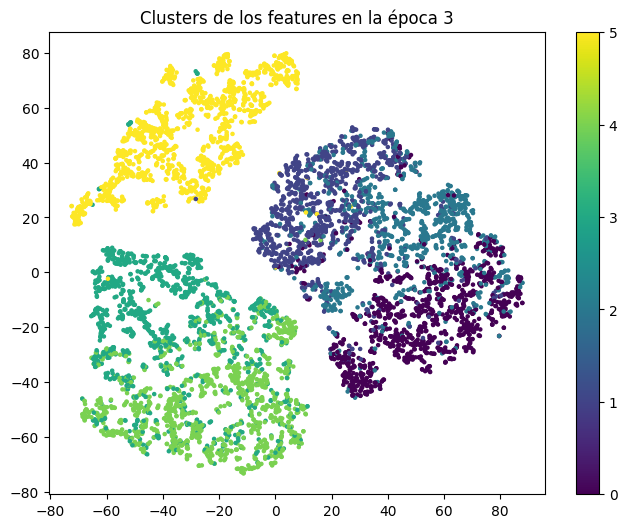

Epoch 3/49
----------
Loss: 1.1491 Acc: 0.9008


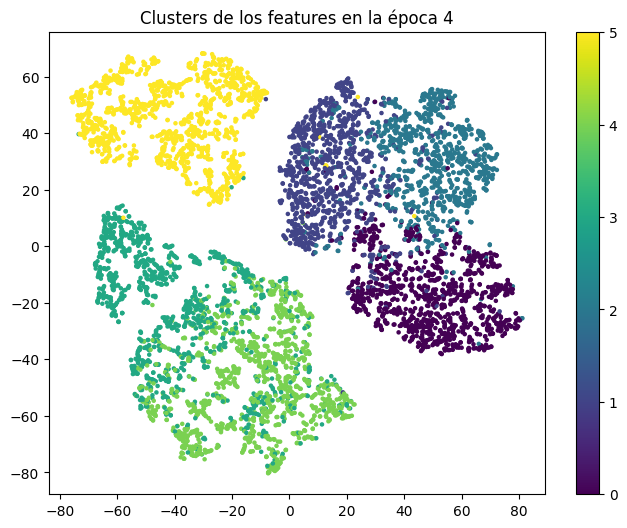

Epoch 4/49
----------
Loss: 1.1348 Acc: 0.9131


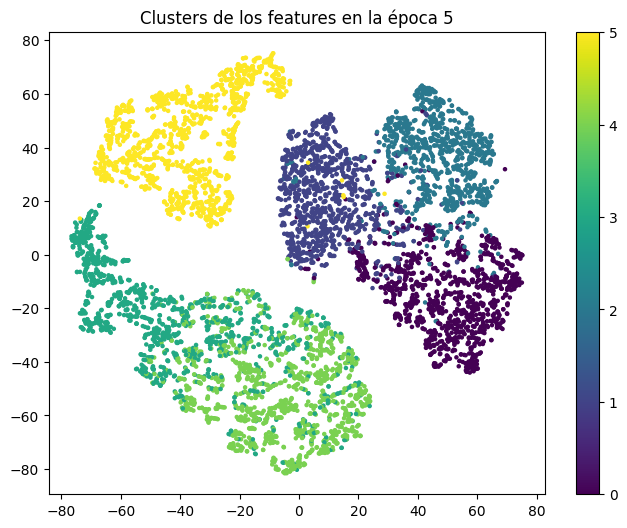

Epoch 5/49
----------
Loss: 1.1230 Acc: 0.9246


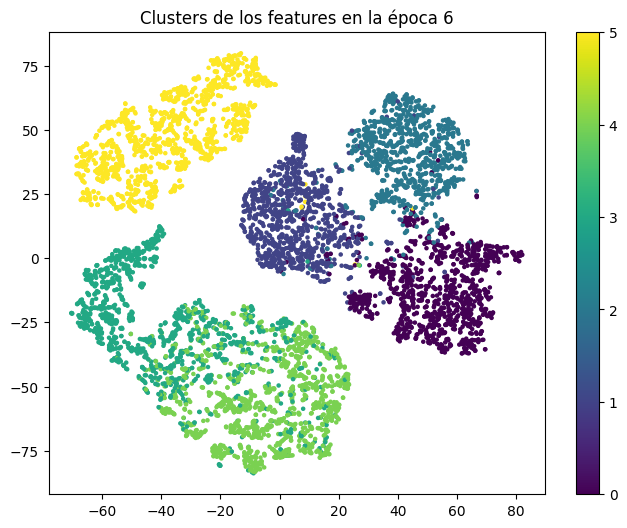

Epoch 6/49
----------
Loss: 1.1122 Acc: 0.9343


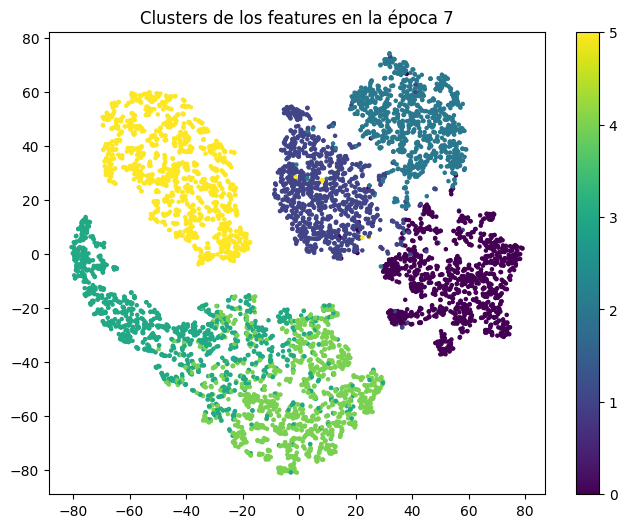

Epoch 7/49
----------
Loss: 1.1096 Acc: 0.9359


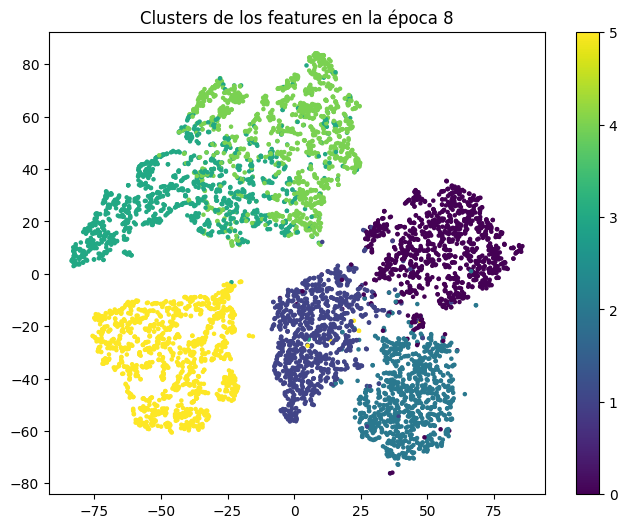

Epoch 8/49
----------
Loss: 1.1008 Acc: 0.9452


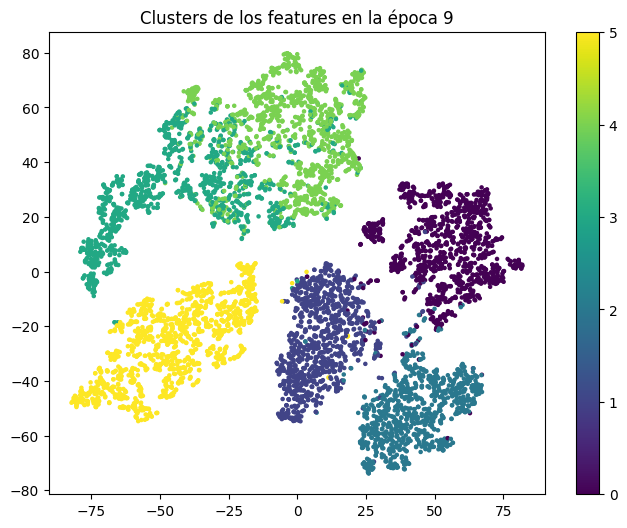

Epoch 9/49
----------
Loss: 1.0999 Acc: 0.9471


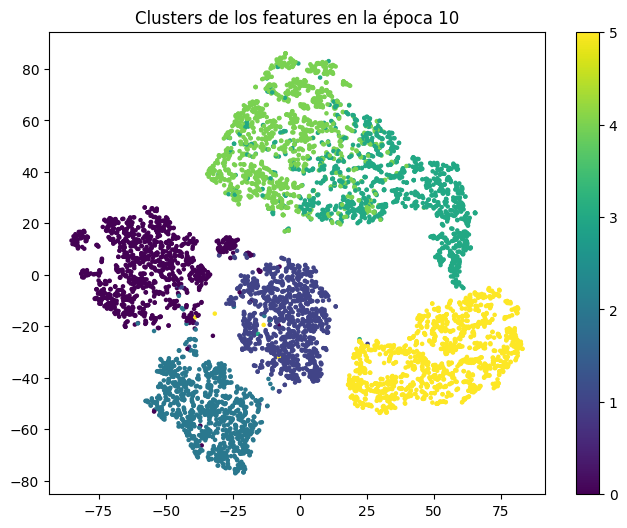

Epoch 10/49
----------
Loss: 1.0977 Acc: 0.9474


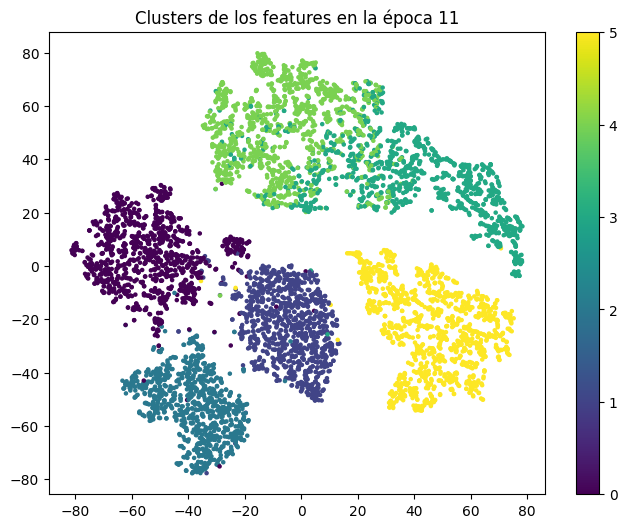

Epoch 11/49
----------
Loss: 1.0935 Acc: 0.9520


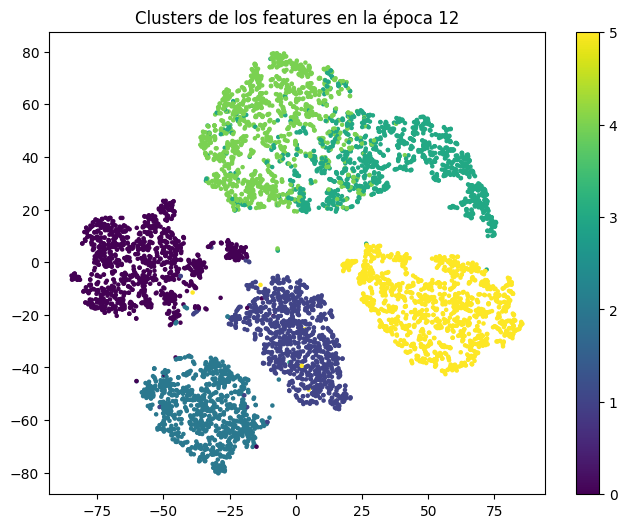

Epoch 12/49
----------
Loss: 1.0900 Acc: 0.9543


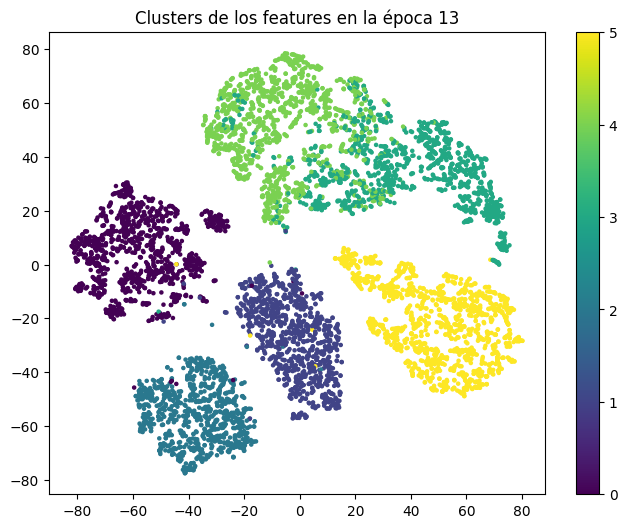

Epoch 13/49
----------
Loss: 1.0903 Acc: 0.9550


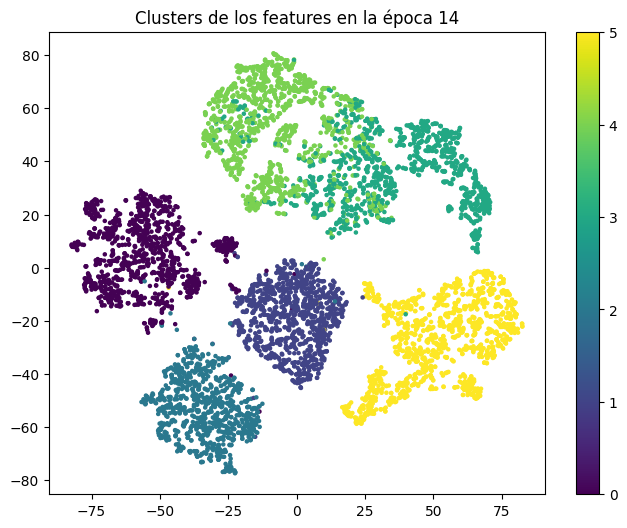

Epoch 14/49
----------
Loss: 1.0896 Acc: 0.9550


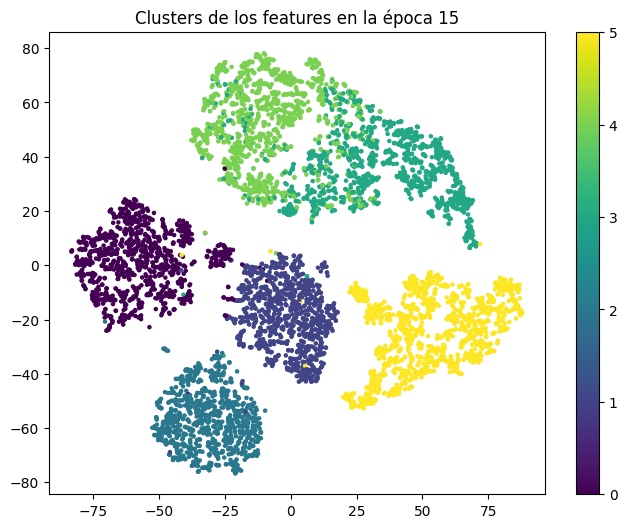

Epoch 15/49
----------
Loss: 1.0863 Acc: 0.9572


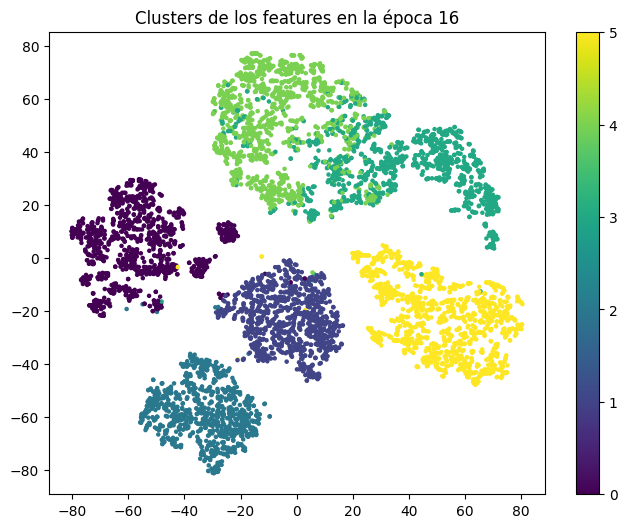

Epoch 16/49
----------
Loss: 1.0860 Acc: 0.9577


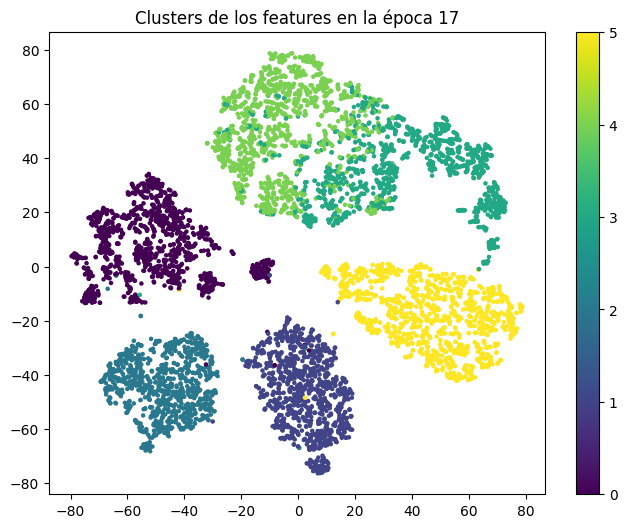

Epoch 17/49
----------
Loss: 1.0864 Acc: 0.9569


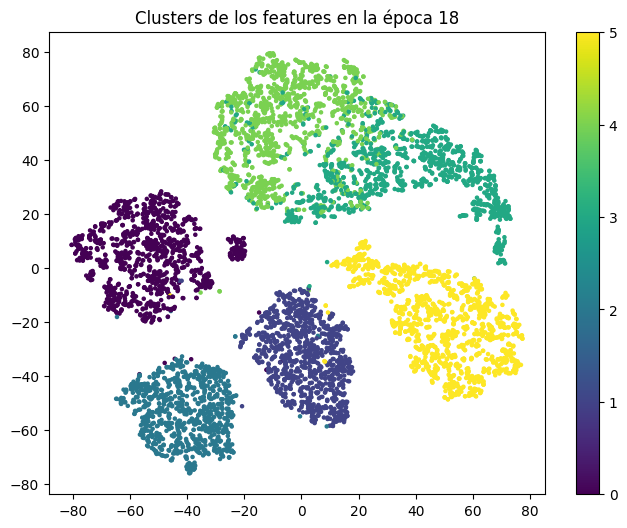

Epoch 18/49
----------
Loss: 1.0872 Acc: 0.9572


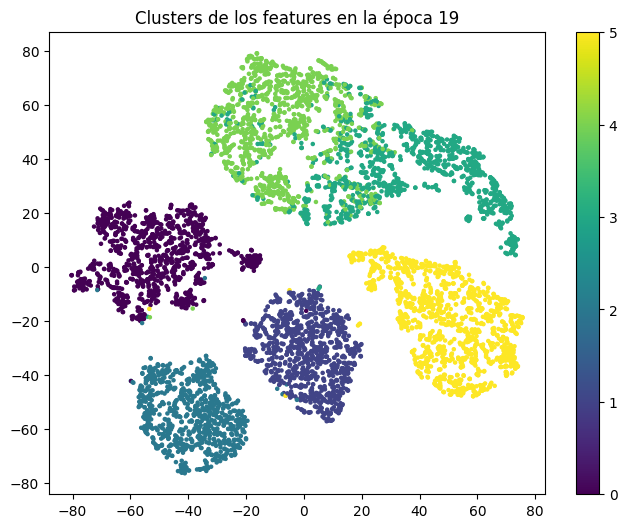

Epoch 19/49
----------
Loss: 1.0889 Acc: 0.9543


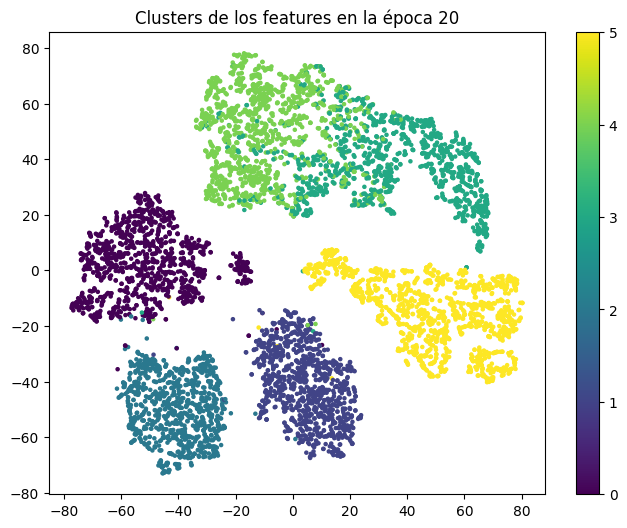

Epoch 20/49
----------
Loss: 1.0859 Acc: 0.9577


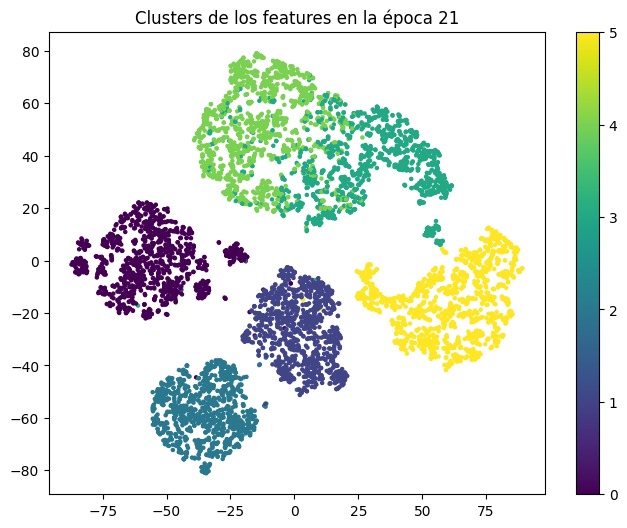

Epoch 21/49
----------
Loss: 1.0858 Acc: 0.9573


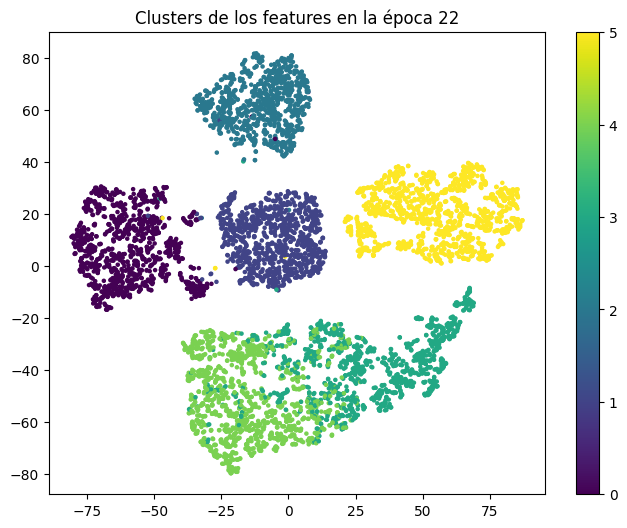

Epoch 22/49
----------
Loss: 1.0859 Acc: 0.9576


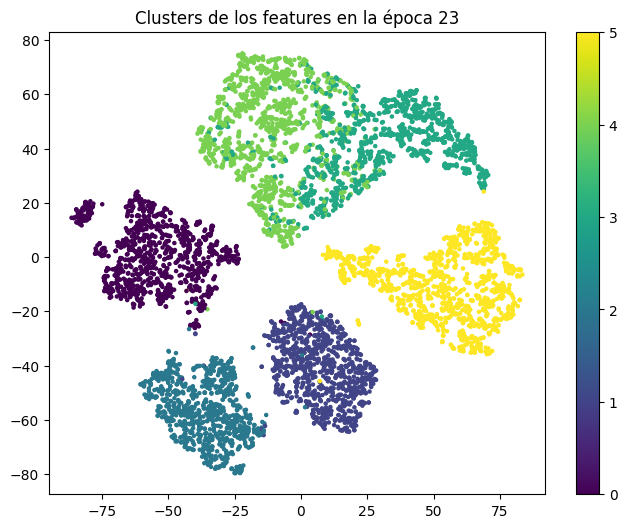

Epoch 23/49
----------
Loss: 1.0853 Acc: 0.9585


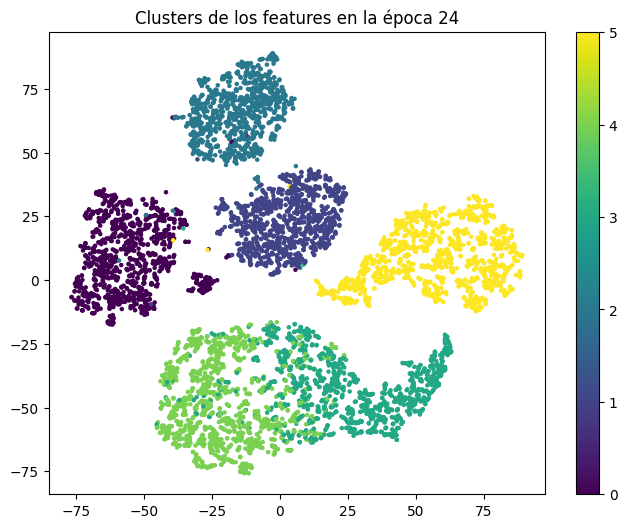

Epoch 24/49
----------
Loss: 1.0823 Acc: 0.9630


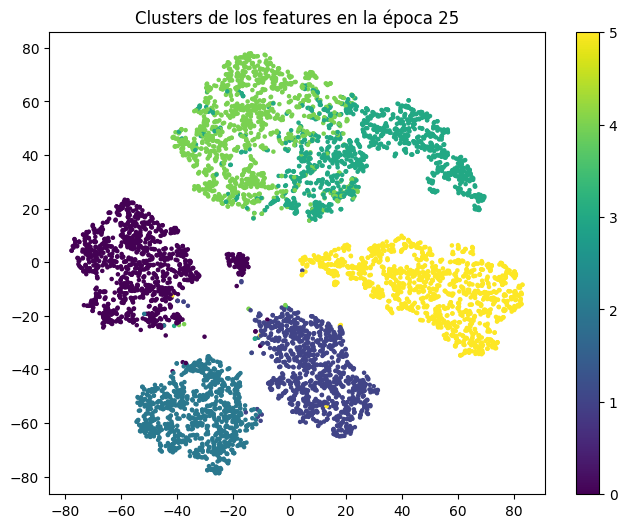

Epoch 25/49
----------
Loss: 1.0827 Acc: 0.9618


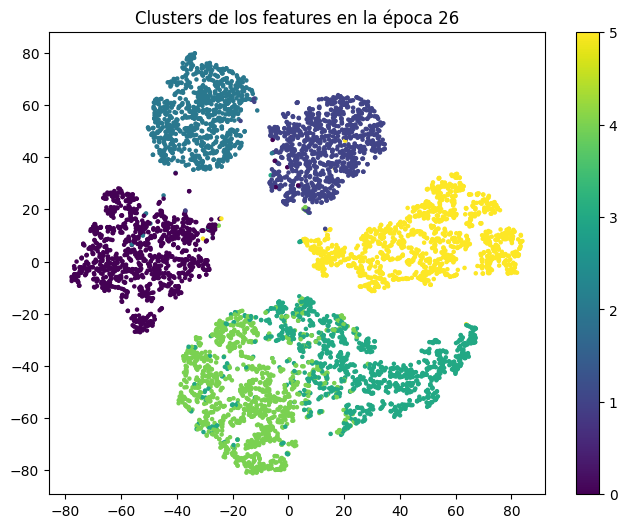

Epoch 26/49
----------
Loss: 1.0854 Acc: 0.9585


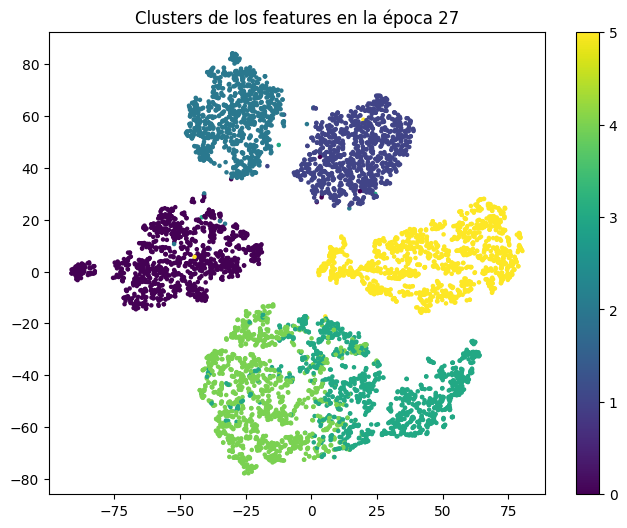

Epoch 27/49
----------
Loss: 1.0846 Acc: 0.9588


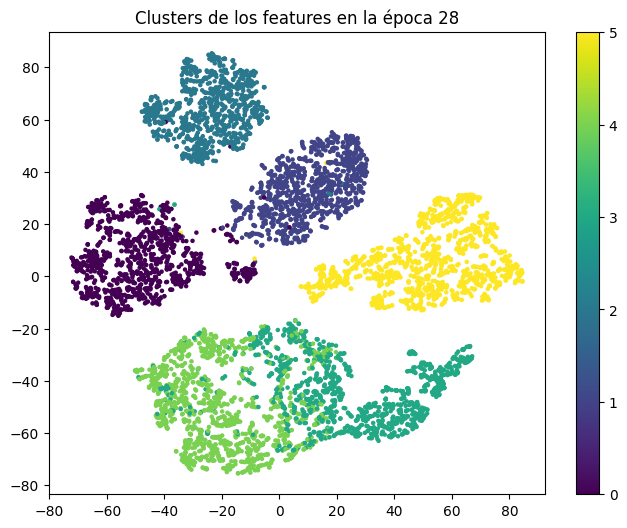

Epoch 28/49
----------
Loss: 1.0830 Acc: 0.9611


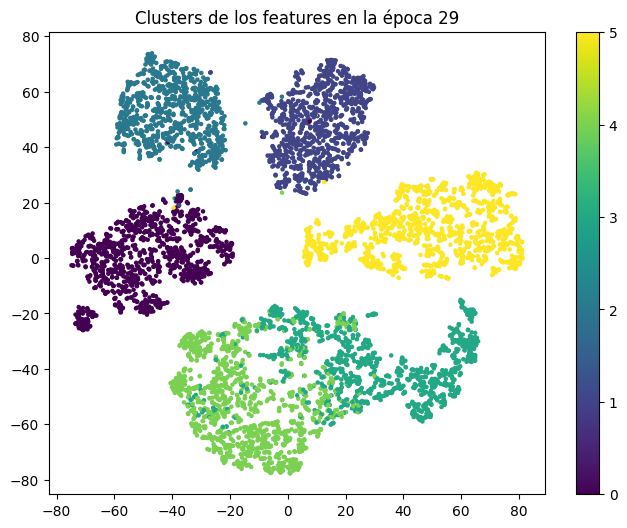

Epoch 29/49
----------
Loss: 1.0807 Acc: 0.9625


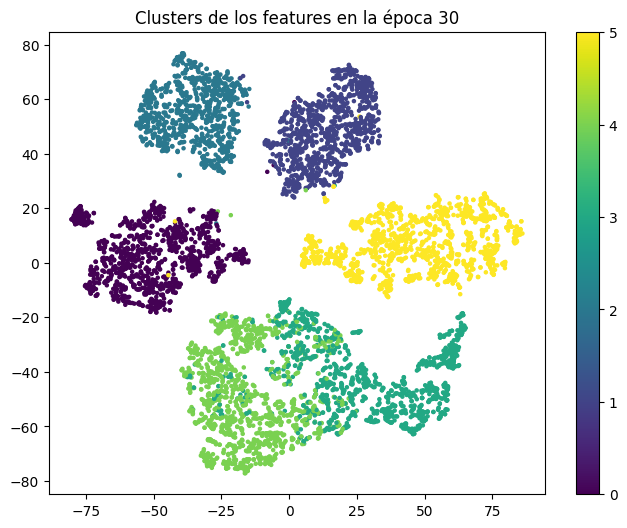

Epoch 30/49
----------
Loss: 1.0824 Acc: 0.9614


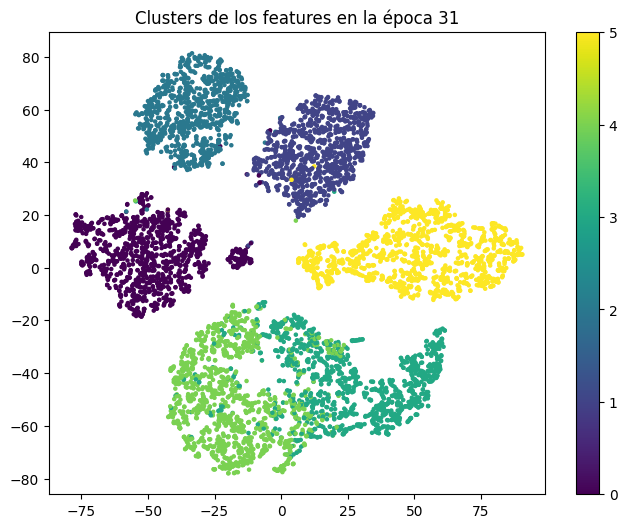

Epoch 31/49
----------
Loss: 1.0824 Acc: 0.9615


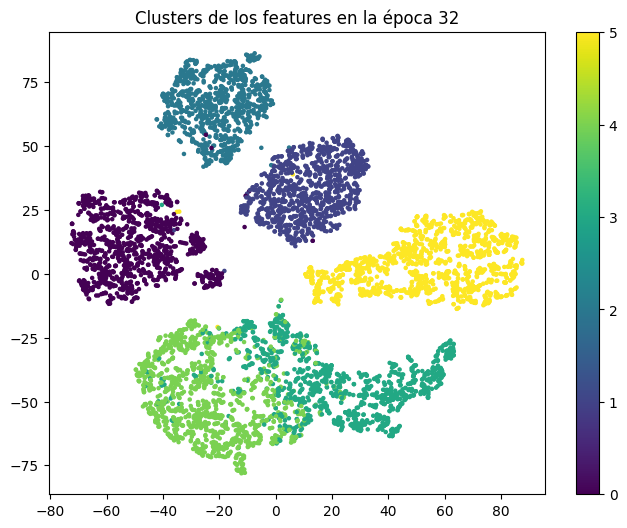

Epoch 32/49
----------
Loss: 1.0807 Acc: 0.9633


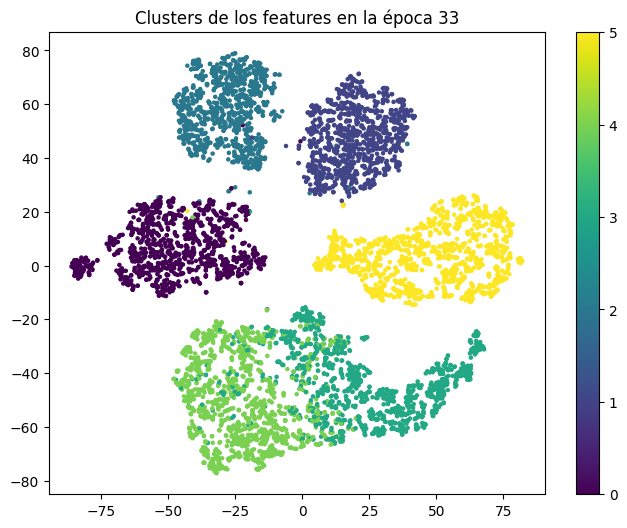

Epoch 33/49
----------
Loss: 1.0850 Acc: 0.9582


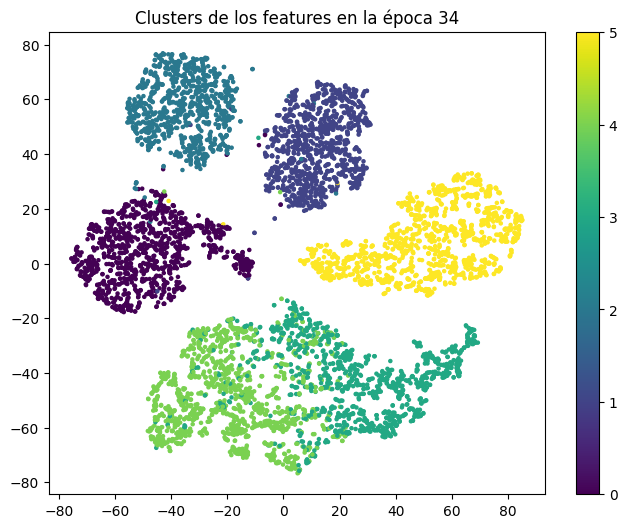

Epoch 34/49
----------
Loss: 1.0820 Acc: 0.9621


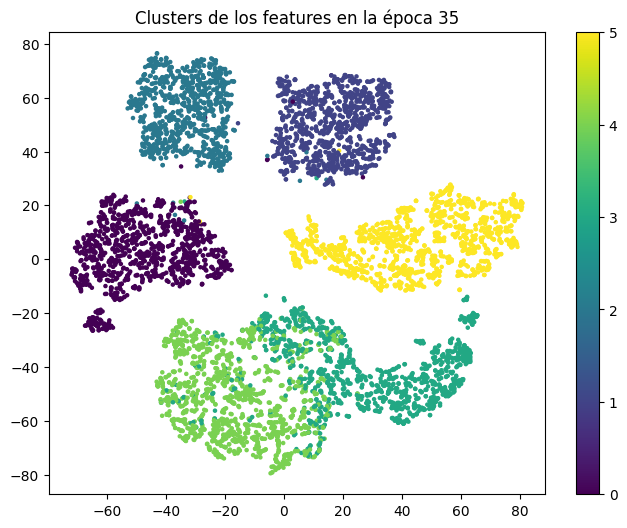

Epoch 35/49
----------
Loss: 1.0815 Acc: 0.9619


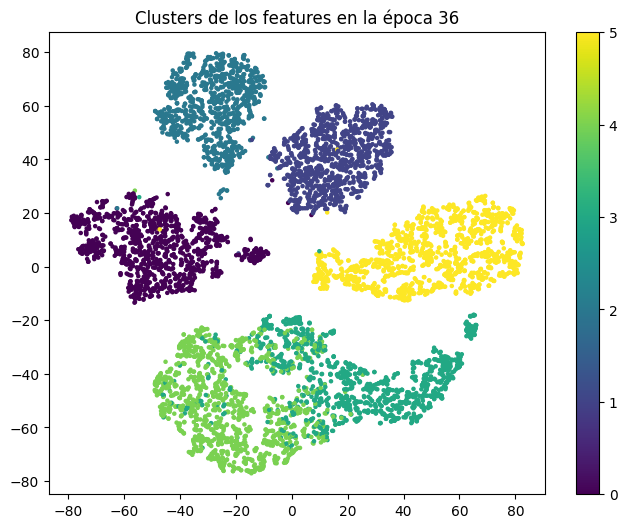

Epoch 36/49
----------
Loss: 1.0789 Acc: 0.9652


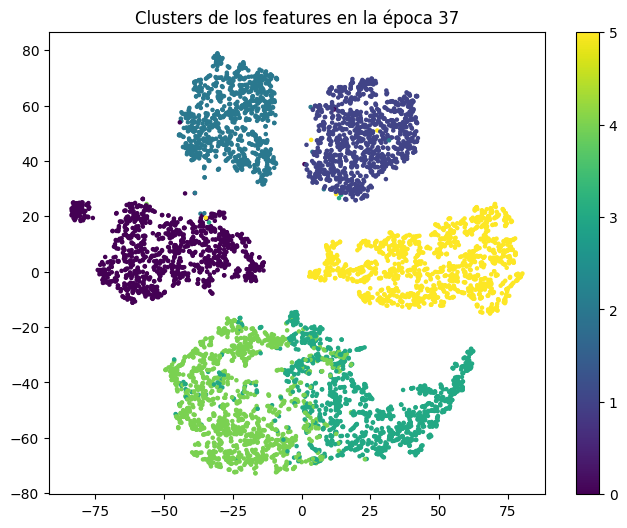

Epoch 37/49
----------
Loss: 1.0793 Acc: 0.9642


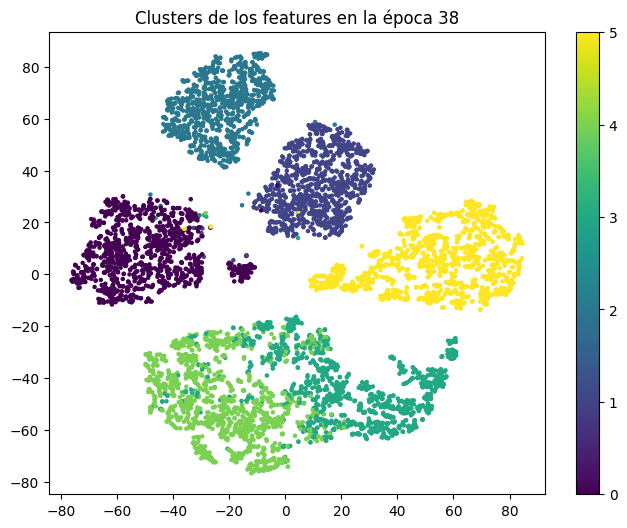

Epoch 38/49
----------
Loss: 1.0771 Acc: 0.9665


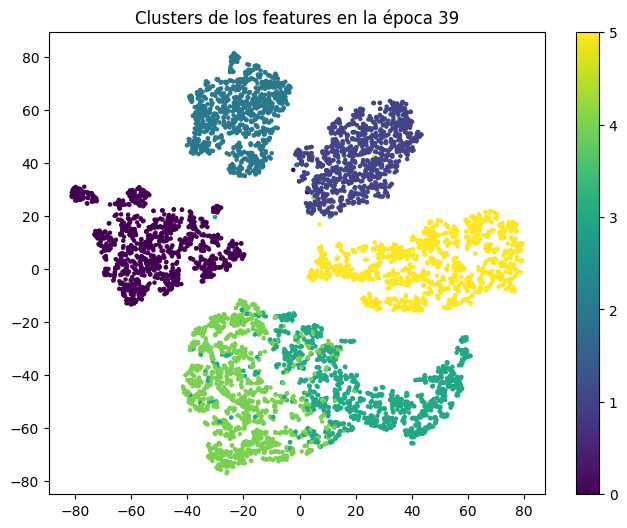

Epoch 39/49
----------
Loss: 1.0791 Acc: 0.9640


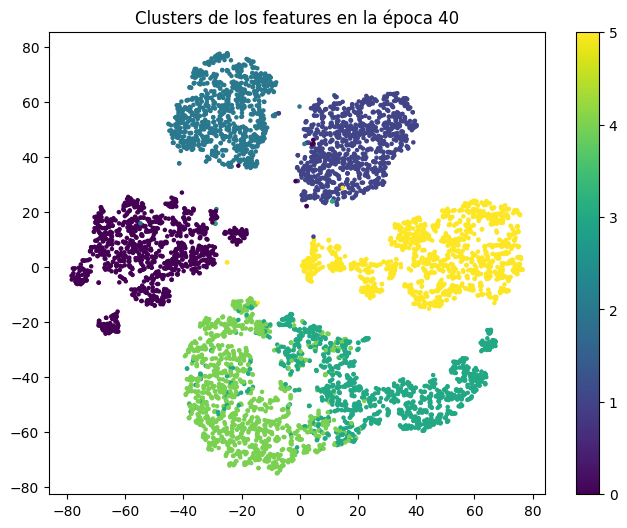

Epoch 40/49
----------
Loss: 1.0786 Acc: 0.9655


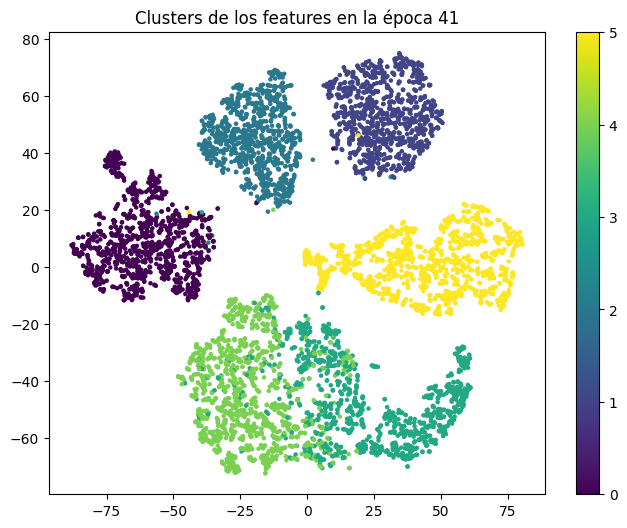

Epoch 41/49
----------
Loss: 1.0773 Acc: 0.9668


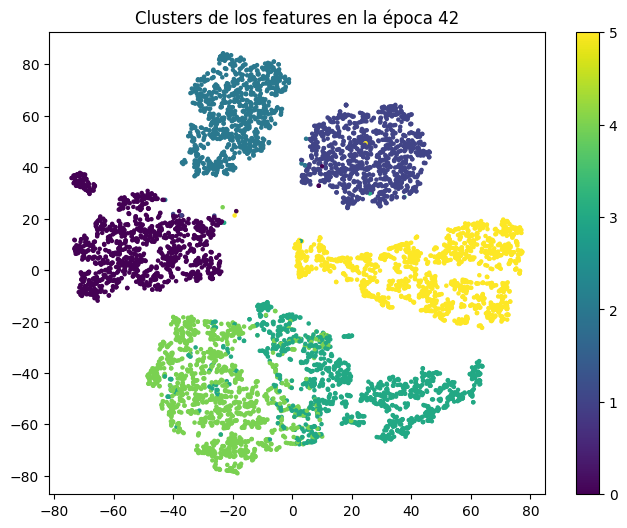

Epoch 42/49
----------
Loss: 1.0770 Acc: 0.9675


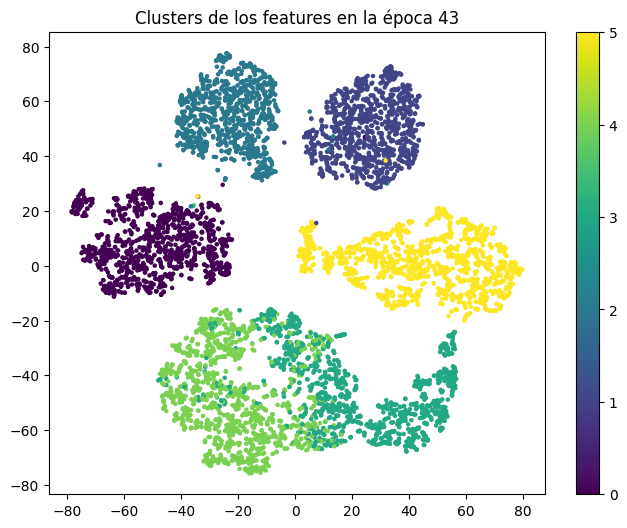

Epoch 43/49
----------
Loss: 1.0781 Acc: 0.9663


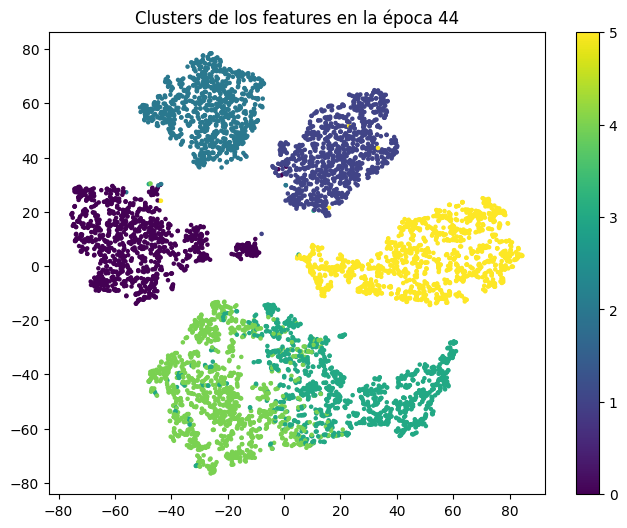

Epoch 44/49
----------
Loss: 1.0756 Acc: 0.9676


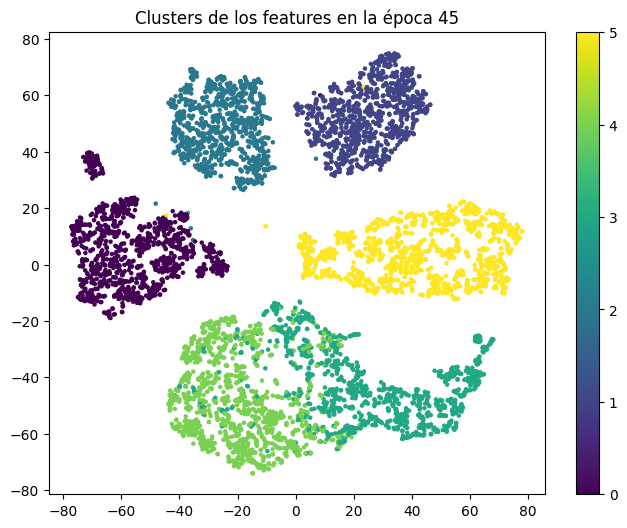

Epoch 45/49
----------
Loss: 1.0757 Acc: 0.9676


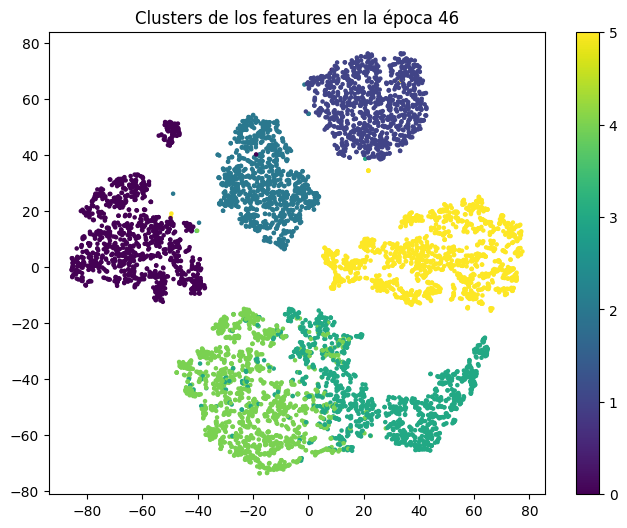

Epoch 46/49
----------
Loss: 1.0776 Acc: 0.9664


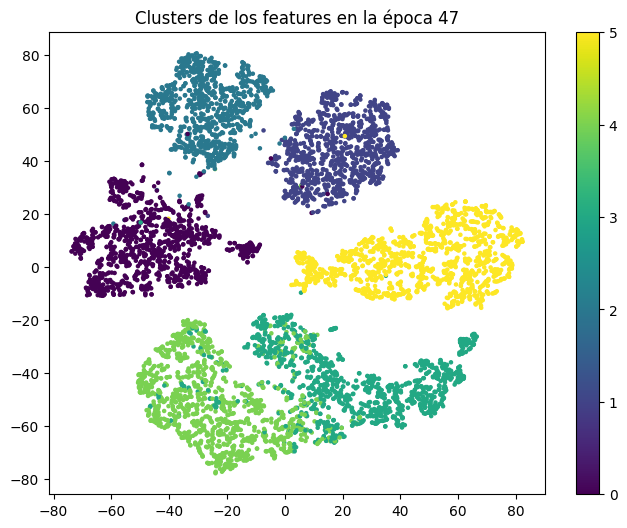

Epoch 47/49
----------
Loss: 1.0757 Acc: 0.9682


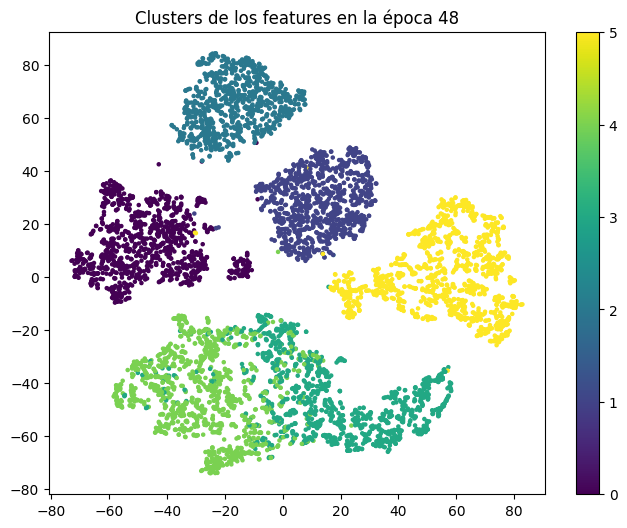

Epoch 48/49
----------
Loss: 1.0752 Acc: 0.9683


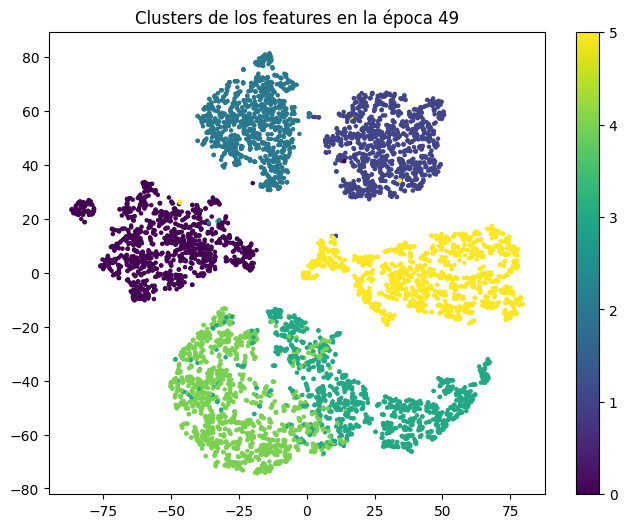

Epoch 49/49
----------
Loss: 1.0788 Acc: 0.9644


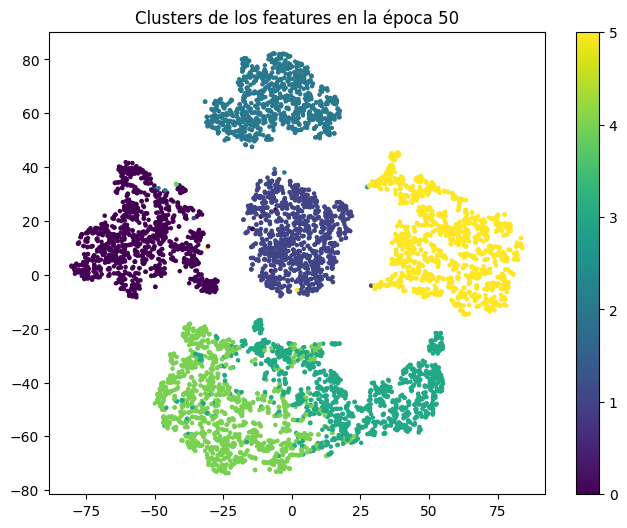

Finished training


In [7]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# train model
train(train_dataloader, model, criterion, optimizer, 50)

## Test

In [8]:
signal_names = ['body_gyro_x', 'body_gyro_y', 'body_gyro_z', 'total_acc_x', 'total_acc_y', 'total_acc_z', 'body_acc_x', 'body_acc_y', 'body_acc_z']
test_signals_dir = []
for name in signal_names:
  path = 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/test/Inertial Signals/{}_test.txt'.format(name)
  test_signals_dir.append(path)
  
test_label_dir = 'C:/Users/Cesar/Documents/projects/har/datasets/UCI HAR Dataset/test/y_test.txt'

test_uci_dataset = aids.ActivityImageDataset(test_signals_dir, test_label_dir)
test_loader = DataLoader(test_uci_dataset, batch_size=32, shuffle=True)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning:

The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead



(2947, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning:

The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead



(2947, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning:

The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead



(2947, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning:

The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead



(2947, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning:

The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead



(2947, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning:

The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead



(2947, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning:

The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead



(2947, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning:

The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead



(2947, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:12: FutureWarning:

The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead



(2947, 128)


c:\Users\Cesar\Documents\projects\har\har-dcnn\activity_image_dataset.py:18: FutureWarning:

The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead



In [10]:

# Evaluación del modelo
model.eval()
correct = 0
total = 0
with torch.no_grad():
  for inputs, labels in test_loader:
    outputs, features = model(inputs)
    # print(labels)
    _, predicted = torch.max(outputs, 1)
    # print(predicted)
    total += labels.size(0)
    correct += (predicted == labels).sum().item()

print(f'Accuracy: {100 * correct / total}%')


Accuracy: 92.05972175093315%


# VGG16

In [12]:
from torchvision import transforms, models
def train_vgg16(train_loader, model, criterion, optimizer, num_epochs):
  for epoch in range(num_epochs):
    print('Epoch {}/{}'.format(epoch, num_epochs - 1))
    print('-' * 10)
    model.train()
    running_loss = 0.0
    running_corrects = 0
        
    for inputs, labels in train_loader:
      optimizer.zero_grad()
      outputs = model(inputs)
      _,preds = torch.max(outputs,1)
      loss = criterion(outputs, labels)      
      loss.backward()
      optimizer.step()
      running_loss += loss.item() * inputs.size(0)
      running_corrects += torch.sum(preds == labels.data)
    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = running_corrects.double() / len(train_loader.dataset)
    print('Loss: {:.4f} Acc: {:.4f}'.format(epoch_loss, epoch_acc))
  print('Finished training')

vgg16 = models.vgg16(pretrained=True)
vgg16.features[0] = nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1)
vgg16.classifier[6] = nn.Linear(4096, 6)

criterion2 = nn.CrossEntropyLoss()
optimizer2 = optim.Adam(vgg16.parameters(), lr=0.001)

# train model
train_vgg16(train_dataloader, vgg16, criterion2, optimizer2, 50)

Epoch 0/49
----------
Loss: 1.2752 Acc: 0.3993
Epoch 1/49
----------
Loss: 1.8100 Acc: 0.3213
Epoch 2/49
----------
Loss: 1.7890 Acc: 0.1823
Epoch 3/49
----------
Loss: 1.7897 Acc: 0.1787
Epoch 4/49
----------
Loss: 1.7889 Acc: 0.1805
Epoch 5/49
----------
Loss: 1.7890 Acc: 0.1908
Epoch 6/49
----------
Loss: 1.7873 Acc: 0.1838
Epoch 7/49
----------
Loss: 1.7882 Acc: 0.1790
Epoch 8/49
----------
Loss: 1.7889 Acc: 0.1824
Epoch 9/49
----------
Loss: 1.7870 Acc: 0.1843
Epoch 10/49
----------
Loss: 1.7869 Acc: 0.1835
Epoch 11/49
----------
Loss: 1.7874 Acc: 0.1842
Epoch 12/49
----------


KeyboardInterrupt: 